<center> <b> <font size="+2"> SME0828 - Introdução à Ciência de Dados - Projeto 1 </font> </b> </center>

<center> <i> Danilo Augusto Ganancin Faria - Nº USP: 9609172 </i> </center>

<center> 20 de setembro de 2020 </center>

Antes de iniciar a resolução dos exercícios é necessário limpar as variáveis e também carregar as bibliotecas que serão utilizadas.

In [1]:
# Limpando as variáveis
from IPython import get_ipython
get_ipython().magic('reset -sf') 

In [2]:
# Realizando importação das bibliotecas
import os
import pandas as pd 
from pandas_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline
import numpy as np
from scipy import stats
from scipy.stats import iqr
import warnings
warnings.filterwarnings('ignore')
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from matplotlib import pyplot as plt
from itertools import groupby
from sklearn.decomposition import PCA
from IPython.display import Math, Latex
from IPython.core.display import Image

In [3]:
# Configurando o alinhamento dos gráficos 
from IPython.core.display import HTML
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

## Exercício 1
Leia os dados com erro novamente, faça a limpeza e remova as duas últimas colunas.

Primeiramente, realizamos a leitura do conjunto de dados, exibimos as quantidades de linhas e colunas, o tipo de dado em cada coluna e também as primeiras linhas para termos uma noção dos dados que iremos trabalhar.

In [4]:
# Leitura do arquivo do conjunto de dados
dados = pd.read_csv('iris-with-errors.csv', header = (0))
print('Este conjunto de dados possui {} linhas e {} colunas.'.format(dados.shape[0], dados.shape[1]))

Este conjunto de dados possui 25 linhas e 5 colunas.


In [5]:
# Identificando o tipo de dado em cada coluna
dados.dtypes

sepal_length     object
sepal_width      object
petal_length    float64
petal_width      object
species          object
dtype: object

In [6]:
# Mostrar as dez primeiras linhas do conjunto de dados
dados.head(10)

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,duplicada
1,5.1,3.5,1.4,0.2,duplicada
2,?,3,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,5.1,3.5,1.4,0.2,duplicada
5,NaN,3.1,1.5,0.2,setosa
6,5,3.6,1.4,0.2,setosa
7,5.4,3.9,1.7,0.4,duplicada
8,5.4,3.9,1.7,0.4,duplicada
9,4.6,3.4,1.4,NaN,setosa


De acordo com a saída acima, será necessário realizar uma limpeza no conjunto de dados para retirada de informações duplicadas e do tipo *NaN*.
Veja que na linha de número 2 há uma observação que provavelmente foi digitada incorretamente, neste caso será necessário removê-la também. 

In [7]:
# Substitui ? por um caracter desejado, neste caso em NaN
dados = dados.replace('?', np.nan)
dados.head(10)

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,duplicada
1,5.1,3.5,1.4,0.2,duplicada
2,NaN,3,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,5.1,3.5,1.4,0.2,duplicada
5,NaN,3.1,1.5,0.2,setosa
6,5,3.6,1.4,0.2,setosa
7,5.4,3.9,1.7,0.4,duplicada
8,5.4,3.9,1.7,0.4,duplicada
9,4.6,3.4,1.4,NaN,setosa


In [8]:
# Remove as linhas com NaN
dados = dados.dropna()
dados.head(10)

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,duplicada
1,5.1,3.5,1.4,0.2,duplicada
3,4.7,3.2,1.3,0.2,setosa
4,5.1,3.5,1.4,0.2,duplicada
6,5,3.6,1.4,0.2,setosa
7,5.4,3.9,1.7,0.4,duplicada
8,5.4,3.9,1.7,0.4,duplicada
10,5,3.4,1.5,0.2,setosa
11,4.4,2.9,1.4,0.2,duplicada
12,4.9,3.1,1.5,0.1,setosa


Observe que, as linhas de números 2 e 5 foram removidas pois continham observação do tipo *NaN*.

In [9]:
# Identificando linhas duplicadas
dados.duplicated()

0     False
1      True
3     False
4      True
6     False
7     False
8      True
10    False
11    False
12    False
13    False
14     True
15    False
16    False
17     True
18    False
19    False
20    False
22    False
dtype: bool

Para cada posição em que a saída retornou *True*, significa que há uma linha duplicada, neste caso temos um total de 5 linhas duplicadas.

In [10]:
# Remove as linhas duplicadas
dados = dados.drop_duplicates()
dados.head(10)

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,duplicada
3,4.7,3.2,1.3,0.2,setosa
6,5,3.6,1.4,0.2,setosa
7,5.4,3.9,1.7,0.4,duplicada
10,5,3.4,1.5,0.2,setosa
11,4.4,2.9,1.4,0.2,duplicada
12,4.9,3.1,1.5,0.1,setosa
13,5.4,3.7,1.5,0.2,setosa
15,4.8,3.4,1.6,0.2,setosa
16,4.8,3,1.4,0.1,setosa


In [11]:
# Contagem de linhas duplicadas
dados.duplicated().sum()

0

Como a contagem de linhas duplicadas foi igual a 0, significa que todas as linhas duplicadas foram removidas.

Após realizar todas as etapas anteriores, enfim temos um conjunto de dados sem erros e entradas duplicadas. Vamos agora proceguir para a remoção das duas últimas colunas do conjunto de dados conforme pede o exercício.

In [12]:
# Identificando as colunas
dados.columns

Index(['sepal_length', 'sepal_width', 'petal_length', 'petal_width',
       'species'],
      dtype='object')

In [13]:
# Removendo as colunas 4 e 5
dados = dados.drop(dados.columns[[3, 4]], axis = 1)
dados.head()

,sepal_length,sepal_width,petal_length
0,5.1,3.5,1.4
3,4.7,3.2,1.3
6,5,3.6,1.4
7,5.4,3.9,1.7
10,5,3.4,1.5


In [14]:
print('Este conjunto de dados possui {} linhas e {} colunas.'.format(dados.shape[0], dados.shape[1]))

Este conjunto de dados possui 14 linhas e 3 colunas.


## Exercício 2
Leia os dados com erro novamente e insira a mediana de cada atributo onde for encontrada *NaN*.

In [15]:
# Leitura do arquivo do conjunto de dados
dados2 = pd.read_csv('iris-with-errors.csv', header = (0))

In [16]:
# Substitui ? por um NaN
dados2 = dados2.replace('?', np.nan)

In [17]:
# Contagem de linhas duplicadas
dados2.duplicated().sum()

5

In [18]:
# Remove as linhas duplicadas
dados2 = dados2.drop_duplicates()

In [19]:
dados2.head(10)

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,duplicada
2,NaN,3,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
5,NaN,3.1,1.5,0.2,setosa
6,5,3.6,1.4,0.2,setosa
7,5.4,3.9,1.7,0.4,duplicada
9,4.6,3.4,1.4,NaN,setosa
10,5,3.4,1.5,0.2,setosa
11,4.4,2.9,1.4,0.2,duplicada
12,4.9,3.1,1.5,0.1,setosa


Até este momento foi realizada a leitura dos dados, substitui-se um possível erro de digitação por um *NaN* e excluiu-se as linhas duplicadas.

Agora, conforme pede o exercício, as informações do tipo *NaN* serão substituídas pela mediana da respectiva coluna. 

In [20]:
# Substituir os NaN pela mediana da coluna
dados2med = dados2.fillna(dados2.median())
dados2med.head(10)

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,duplicada
2,5,3,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
5,5,3.1,1.5,0.2,setosa
6,5,3.6,1.4,0.2,setosa
7,5.4,3.9,1.7,0.4,duplicada
9,4.6,3.4,1.4,0.2,setosa
10,5,3.4,1.5,0.2,setosa
11,4.4,2.9,1.4,0.2,duplicada
12,4.9,3.1,1.5,0.1,setosa


## Exercício 3
Conside os dados da Iris e mostre a distribuição de probabilidades de cada uma das variáveis após a normalização e padronização.

In [21]:
# Leitura do arquivo do conjunto de dados
iris3 = pd.read_csv('iris.csv', header = (0))
print('Este conjunto de dados possui {} linhas e {} colunas.'.format(iris3.shape[0], iris3.shape[1]))

Este conjunto de dados possui 150 linhas e 5 colunas.


Este conjunto de dados foi usado pela primeira vez por Sir. R. A. Fisher, mais importante estatístico do século XX.

As variáveis deste conjunto de dados são:
 - sepal_length: comprimento da sépala (cm);
 - sepal_width: largura da sépala (cm);
 - petal_length: comprimento da sépala (cm);
 - petal_width: largura da pétala (cm).
 
Distribuídas nas seguintes classes:
 - Iris-Setosa;
 - Iris-Versicolor;
 - Iris-Virgínica.

In [22]:
# Visualização das 5 primeiras linhas do conjunto de dados
iris3.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [23]:
# Quantidade de observações de cada uma das espécies
iris3['species'].value_counts()

virginica     50
versicolor    50
setosa        50
Name: species, dtype: int64

 - Normalização do conjunto de dados

In [24]:
# Considera somente os atributos, ignorando a última coluna, que contém a classe
X = np.array(iris3[iris3.columns[0:iris3.shape[1]-1]])
for i  in range(X.shape[1]):
    print("Maior valor da coluna:", i, ":", max(X[:, i]))
    print("Menor Valor da coluna:", i, ":", min(X[:, i]))
# Prepara a função para transformar os dados
scaler = MinMaxScaler(feature_range = (0, 1))
# Realiza a normalização e coloca em um novo vetor
X_norm = scaler.fit_transform(X)

Maior valor da coluna: 0 : 7.9
Menor Valor da coluna: 0 : 4.3
Maior valor da coluna: 1 : 4.4
Menor Valor da coluna: 1 : 2.0
Maior valor da coluna: 2 : 6.9
Menor Valor da coluna: 2 : 1.0
Maior valor da coluna: 3 : 2.5
Menor Valor da coluna: 3 : 0.1


Feita a normalização do conjunto de dados, a seguir é possível conferir os valores mínimo e máximo do conjunto de dados normalizado.

In [25]:
print('Valor mínimo dos atributos:', np.amin(X_norm, axis = 0))
print('Valor máximo dos atributos:', np.amax(X_norm, axis = 0))

Valor mínimo dos atributos: [0. 0. 0. 0.]
Valor máximo dos atributos: [1. 1. 1. 1.]


 - Padronização do conjunto de dados

In [26]:
X = np.array(iris3[iris3.columns[0:iris3.shape[1]-1]])
# Prepara a função para transformar os dados
scaler = StandardScaler().fit(X)
# Realiza a padronização (média = 0, variância = 1)
rescaledX = scaler.transform(X)

Para verificar se cada uma das colunas apresentam média igual a zero e variância igual a um (ou desvio padrão igual a 1).

In [27]:
for i in np.arange(0, rescaledX.shape[1]):
    print('Média da coluna', i, 'é igual a: ', np.mean(rescaledX[:, i]))
    print('Desvio padrão da coluna', i, 'é igual a: ', np.std(rescaledX[:, i]),'\n')

Média da coluna 0 é igual a:  -4.736951571734001e-16
Desvio padrão da coluna 0 é igual a:  1.0 

Média da coluna 1 é igual a:  -6.631732200427602e-16
Desvio padrão da coluna 1 é igual a:  0.9999999999999999 

Média da coluna 2 é igual a:  3.315866100213801e-16
Desvio padrão da coluna 2 é igual a:  0.9999999999999998 

Média da coluna 3 é igual a:  -2.842170943040401e-16
Desvio padrão da coluna 3 é igual a:  1.0 



 - Distribuição das variáveis após normalização e padronização

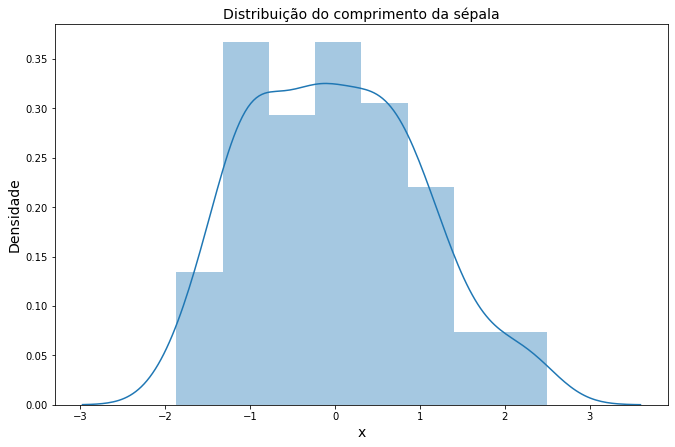

In [28]:
# Distribuição da sepal_length
plt.figure(figsize = (11, 7))
sns.distplot(rescaledX[:, 0], hist = True)
plt.title('Distribuição do comprimento da sépala', fontsize = 14)
plt.xlabel('x', fontsize = 14)
plt.ylabel('Densidade', fontsize = 14)
plt.show(True)

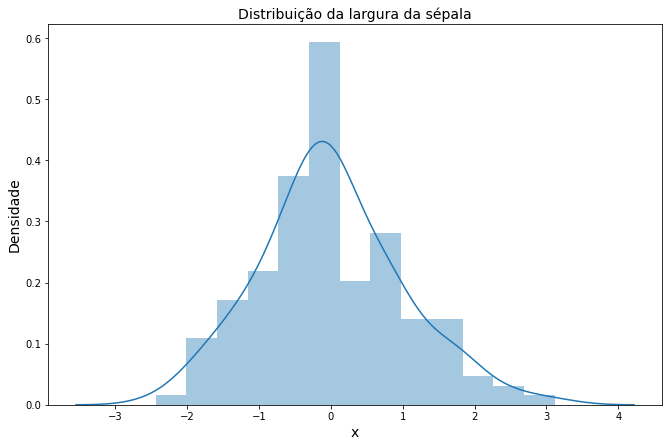

In [29]:
# Distribuição da sepal_width
plt.figure(figsize = (11, 7))
sns.distplot(rescaledX[:, 1], hist = True)
plt.title('Distribuição da largura da sépala', fontsize = 14)
plt.xlabel('x', fontsize = 14)
plt.ylabel('Densidade', fontsize = 14)
plt.show(True)

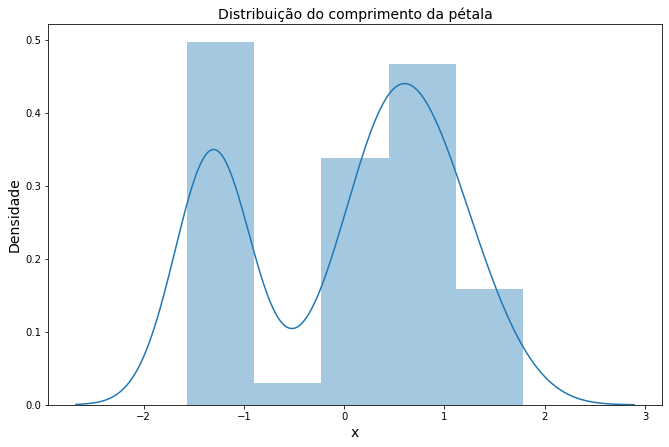

In [30]:
# Distribuição da petal_length
plt.figure(figsize = (11, 7))
sns.distplot(rescaledX[:, 2], hist = True)
plt.title('Distribuição do comprimento da pétala', fontsize = 14)
plt.xlabel('x', fontsize = 14)
plt.ylabel('Densidade', fontsize = 14)
plt.show(True)

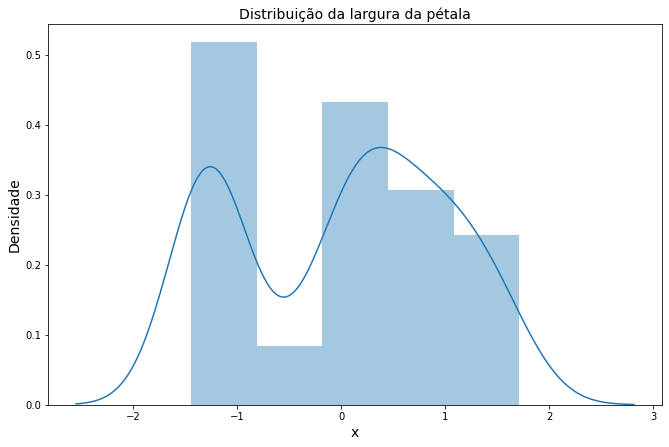

In [31]:
# Distribuição da petal_width
plt.figure(figsize = (11, 7))
sns.distplot(rescaledX[:, 3], hist = True)
plt.title('Distribuição da largura da pétala', fontsize = 14)
plt.xlabel('x', fontsize = 14)
plt.ylabel('Densidade', fontsize = 14)
plt.show(True)

## Exercício 4
Amostre os dados da Iris e selecione 10 elementos em cada classe.

In [32]:
# Leitura do arquivo do conjunto de dados
iris4 = pd.read_csv('iris.csv', header = (0))

In [33]:
# Definindo as classes
classes = iris4[iris4.columns[-1]]
print(classes)

0         setosa
1         setosa
2         setosa
3         setosa
4         setosa
         ...    
145    virginica
146    virginica
147    virginica
148    virginica
149    virginica
Name: species, Length: 150, dtype: object


In [34]:
# Quantidade de elementos por classe
[len(list(group)) for key, group in groupby(classes)]

[50, 50, 50]

In [35]:
#Amostragem com 10 elementos em cada classe
N = 10
# Classes
cl = np.unique(classes)
X = np.array(iris4)
Xnew = []
cls = np.array(iris4[iris4.columns[-1]])
for i in np.arange(0, len(cl)):
    a = np.argwhere(cls == cl[i])
    # Seleciona os índices nos dados de forma aleatória
    inds = np.random.choice(a[:, 0], N, replace = False)
    Xnew.append(X[inds, :])
Xnew = np.array(Xnew)
print('Dados obtidos a partir da amostragem:')
print(Xnew)

Dados obtidos a partir da amostragem:
[[[4.9 3.1 1.5 0.1 'setosa']
  [5.4 3.4 1.7 0.2 'setosa']
  [5.0 3.4 1.5 0.2 'setosa']
  [4.9 3.0 1.4 0.2 'setosa']
  [5.1 3.8 1.9 0.4 'setosa']
  [5.1 3.5 1.4 0.2 'setosa']
  [5.0 3.0 1.6 0.2 'setosa']
  [5.1 3.8 1.6 0.2 'setosa']
  [5.4 3.7 1.5 0.2 'setosa']
  [4.4 2.9 1.4 0.2 'setosa']]

 [[6.0 3.4 4.5 1.6 'versicolor']
  [5.8 2.7 3.9 1.2 'versicolor']
  [5.0 2.0 3.5 1.0 'versicolor']
  [6.8 2.8 4.8 1.4 'versicolor']
  [5.9 3.0 4.2 1.5 'versicolor']
  [5.8 2.6 4.0 1.2 'versicolor']
  [6.0 2.2 4.0 1.0 'versicolor']
  [6.4 2.9 4.3 1.3 'versicolor']
  [5.4 3.0 4.5 1.5 'versicolor']
  [6.7 3.0 5.0 1.7 'versicolor']]

 [[6.4 2.7 5.3 1.9 'virginica']
  [5.7 2.5 5.0 2.0 'virginica']
  [5.8 2.7 5.1 1.9 'virginica']
  [6.1 2.6 5.6 1.4 'virginica']
  [6.4 3.1 5.5 1.8 'virginica']
  [7.1 3.0 5.9 2.1 'virginica']
  [5.8 2.8 5.1 2.4 'virginica']
  [6.8 3.2 5.9 2.3 'virginica']
  [7.7 2.6 6.9 2.3 'virginica']
  [6.7 3.0 5.2 2.3 'virginica']]]


## Exercício 5
Monte um *boxplot* para cada variável dos dados da Iris.


In [36]:
# Leitura do arquivo do conjunto de dados
data = pd.read_csv('iris.csv', header = (0))
data.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.054000,3.758667,1.198667
std,0.828066,0.433594,1.764420,0.763161
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


Os dados da Iris são compostos por quatro variáveis a saber: *sepal_length*, *sepal_width*, *petal_length* e *petal_width*. A seguir são feitos os *boxplots* considerando cada um dessas variáveis.

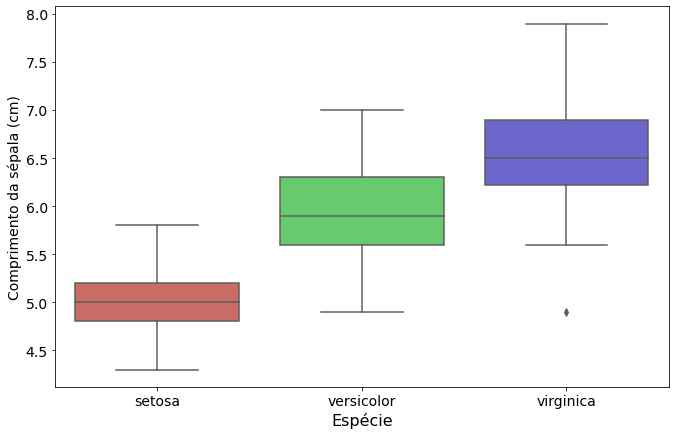

In [37]:
# Boxplot do comprimento da sépala x espécie
plt.figure(figsize = (11, 7))
sns.boxplot(x = "species", y = "sepal_length", data = data, palette = "hls")
plt.xlabel('Espécie', fontsize = 16)
plt.ylabel('Comprimento da sépala (cm)', fontsize = 14)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.show(True)

É possível observar que para o comprimento da sépala há um possível *outlier* da espécie virgínica.

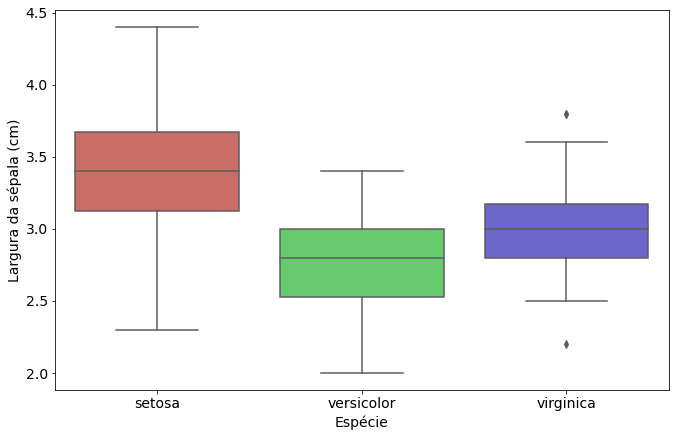

In [38]:
# Boxplot da largura da sépala x espécie
plt.figure(figsize = (11, 7))
sns.boxplot(x = "species", y = "sepal_width", data = data, palette = "hls")
plt.xlabel('Espécie', fontsize = 14)
plt.ylabel('Largura da sépala (cm)', fontsize = 14)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.show(True)

Considerando a largura da sépala, assim como no caso anterior, há dois possíveis *outliers* da espécie virgínica.

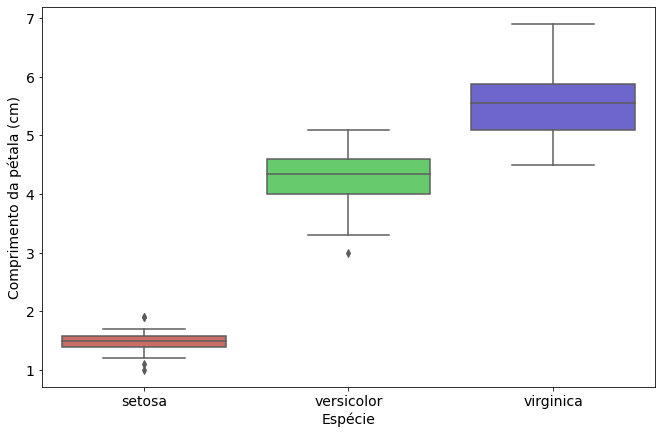

In [39]:
# Boxplot do comprimento da pétala x espécie
plt.figure(figsize = (11, 7))
sns.boxplot(x = "species", y = "petal_length", data = data, palette = "hls")
plt.xlabel('Espécie', fontsize = 14)
plt.ylabel('Comprimento da pétala (cm)', fontsize = 14)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.show(True)

Neste caso, há a ocorrência de possíveis *outliers* nas espécies setosa e versicolor.

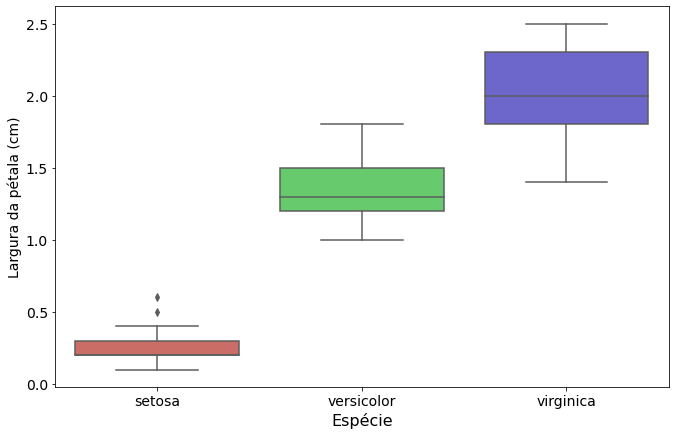

In [40]:
# Boxplot da largura da pétala x espécie
plt.figure(figsize = (11, 7))
sns.boxplot(x = "species", y = "petal_width", data = data, palette = "hls")
plt.xlabel('Espécie', fontsize = 16)
plt.ylabel('Largura da pétala (cm)', fontsize = 14)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.show(True)

Para a largura da pétala, há dois possívies *outliers* da espécie setosa.

## Exercício 6
Encontre os *outliers* nos dados das bases Iris e Boston Housing.


 - Iris

Dentre as diversas maneiras de se identificar *outliers*, uma maneira bem simples é utilizando o *boxplot*. Tendo por base os *boxplots* do exercício anterior, queremos identificar os *outliers* deste conjunto de dados.

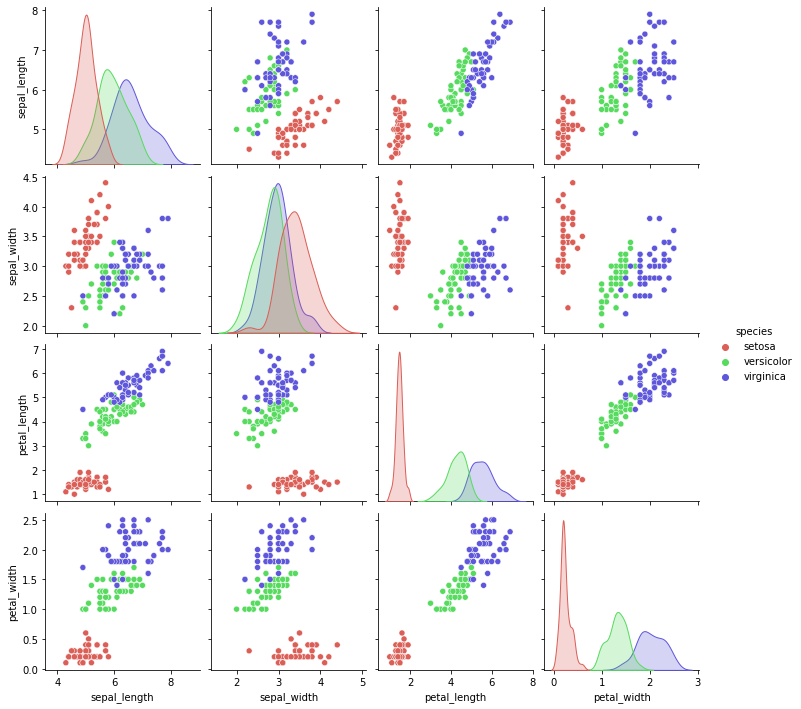

In [41]:
# Gráfico de pares 
sns.pairplot(data, hue = "species", palette = "hls")
plt.show(True)

Na figura acima, é possível conferir a distribuição de cada uma das variáveis para cada uma das espécies de Iris. Além disso, os gráficos de dispersão mostra a presença de possíveis *outliers*, por exemplo, na largura da sépala da Iris-Setosa. 

 - Identificando os *outliers*

In [42]:
# Função para identificar os outliers
def find_outliers(data):
    
    # Amplitude interquantil
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    AIQ = q3 - q1

    outliers_indicator = (data < (q1 - 1.5 * AIQ)) | (data > (q3 + 1.5 * AIQ))
    outliers = data.loc[outliers_indicator.any(axis = 1)]
    outliers_indicator = outliers_indicator.loc[outliers_indicator.any(axis = 1)]
    data_no_outliers = data.drop(axis = 0,index = outliers.index)

    return outliers_indicator, outliers, data_no_outliers

In [43]:
outliers_indicator, outliers, iris_no_outliers = find_outliers(data)

In [44]:
outliers

,sepal_length,sepal_width,petal_length,petal_width,species
15,5.7,4.4,1.5,0.4,setosa
32,5.2,4.1,1.5,0.1,setosa
33,5.5,4.2,1.4,0.2,setosa
60,5.0,2.0,3.5,1.0,versicolor


Portanto, no conjunto de dados da Iris encontrou-se 4 *outiers* todas da variável *sepal_width*, conforme saída do comando acima.

 - *Boston Housing*

In [45]:
# Leitura do arquivo do conjunto de dados
boston = pd.read_csv('BostonHousing.csv', header=(0))
print('Este conjunto de dados possui {} linhas e {} colunas.'.format(boston.shape[0], boston.shape[1]))

Este conjunto de dados possui 506 linhas e 14 colunas.


A seguir é feito a descrição das varíaveis deste conjunto de dados para melhor compreendermos e interpretarmos os resultados.

 - CRIM: taxa de crime *per capita* por cidade;
 - ZN: proporção de terreno residencial zoneado por lotes com mais de 25.000 pés quadrados;
 - INDUS: proporção de acres de negócios não varejistas por cidade;
 - CHAS: variável *dummy* de Charles River (= 1 se a área é delimitada por rio; 0 caso contrário);
 - NOX: concentração de óxidos nítricos (partes por 10 milhões);
 - RM: quantidade média de quartos por habitação;
 - AGE: proporção de unidades ocupadas pelo proprietário construídas antes de 1940; 
 - DIS: distâncias ponderadas para cinco centros de empregos de Boston;
 - RAD: índice de acessibilidade a rodovias radiais;
 - TAX: taxa de impostos de propriedade de valor total por $\$10.000$;
 - PTRATIO: proporção de aluno-professor por cidade; 
 - B: $1000(Bk - 0,63)^2$ em que $Bk$ é a proporção de negros por cidade; 
 - LSTAT: $\%$ da população com status inferior;
 - MEDV: mediana das casas ocupadas pelo proprietário a cada $\$1000$.

In [46]:
# Identificando o tipo de dado em cada coluna
boston.dtypes

crim       float64
zn         float64
indus      float64
chas         int64
nox        float64
rm         float64
age        float64
dis        float64
rad          int64
tax          int64
ptratio    float64
b          float64
lstat      float64
medv       float64
dtype: object

In [47]:
# Quantidade de observações distintas em cada variável
boston.nunique()

crim       504
zn          26
indus       76
chas         2
nox         81
rm         446
age        356
dis        412
rad          9
tax         66
ptratio     46
b          357
lstat      455
medv       229
dtype: int64

In [48]:
# Mostrar as cinco primeiras linhas do conjunto de dados
boston.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


In [49]:
# Investigando possíveis linhas duplicadas
boston.duplicated().sum()

0

De acordo com a saída do código acima, este conjunto de dados não possui linhas duplicadas.

In [50]:
# Verificando a existência de dados faltantes
boston.isnull().sum()

crim       0
zn         0
indus      0
chas       0
nox        0
rm         0
age        0
dis        0
rad        0
tax        0
ptratio    0
b          0
lstat      0
medv       0
dtype: int64

In [51]:
# Estatísticas descritivas das variáveis do conjunto de dados
boston.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
crim,506.0,3.613524,8.601545,0.00632,0.082045,0.25651,3.677082,88.9762
zn,506.0,11.363636,23.322453,0.00000,0.000000,0.00000,12.500000,100.0000
indus,506.0,11.136779,6.860353,0.46000,5.190000,9.69000,18.100000,27.7400
chas,506.0,0.069170,0.253994,0.00000,0.000000,0.00000,0.000000,1.0000
nox,506.0,0.554695,0.115878,0.38500,0.449000,0.53800,0.624000,0.8710
rm,506.0,6.284634,0.702617,3.56100,5.885500,6.20850,6.623500,8.7800
age,506.0,68.574901,28.148861,2.90000,45.025000,77.50000,94.075000,100.0000
dis,506.0,3.795043,2.105710,1.12960,2.100175,3.20745,5.188425,12.1265
rad,506.0,9.549407,8.707259,1.00000,4.000000,5.00000,24.000000,24.0000
tax,506.0,408.237154,168.537116,187.00000,279.000000,330.00000,666.000000,711.0000


A constatação anterior pode ser verificada conferindo a coluna *count* da saída anterior, nela é possível observar que cada uma das variáveis do conjunto de dados possui 506 observações. 

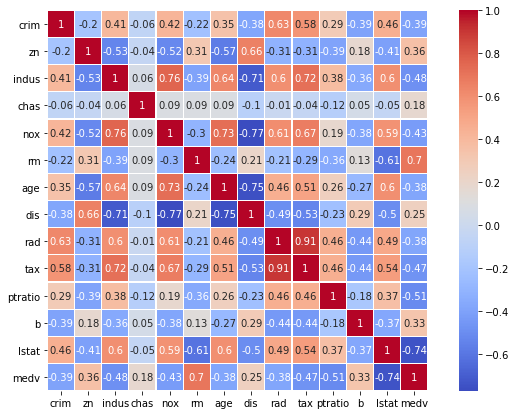

In [52]:
# Matriz de correlação  
plt.figure(figsize = (11, 7))
sns.heatmap(data = boston.corr().round(2), annot = True, cmap = 'coolwarm', linewidths = 0.2, square = True)
plt.show(True)

Segundo a figura acima, destaca-se que:
 
 - *tax* está altamente correlacionado com *rad*;
 - *indus* está positivamente correlacionado com *nox* e *tax* e negativamente correlacionado com *dis*;
 - *nox* está positivamente correlacionado com *age*  e negativamente correlacionado com *dis*;
 - *rm* está positivamente correlacionado com *medv*;
 - *age* está negativamente correlacionado com *dis*;
 - *lstat* está negativamente correlacionado com *medv*.

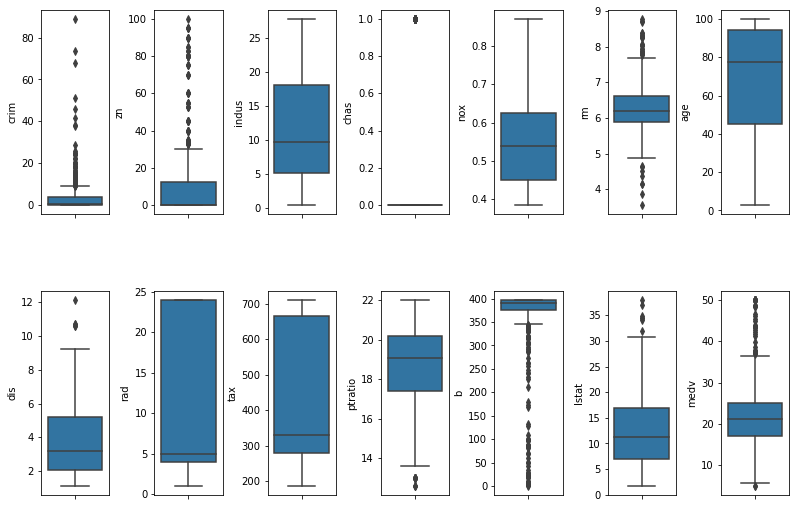

In [53]:
# Boxplot para todas as variáveis
fig, axs = plt.subplots(ncols = 7, nrows = 2, figsize = (11, 7))
index = 0
axs = axs.flatten()
for k, v in boston.items():
    sns.boxplot(y = k, data = boston, ax = axs[index])
    index += 1
plt.tight_layout(pad = 0.5, w_pad = 0.5, h_pad = 7.0)

Nota-se, uma grande quantidade de *outliers* em algumas das variáveis, por exemplo, *crim*, *zn*, *rm*, *dis*, *ptratio*, *b*, *lstat* e *medv*. Por outro lado, na variável *chas* não faz sentido falarmos em *outliers* pelo fato de ser uma variável binária.

 - Identificando os *outliers*

In [54]:
# Porcentagem de outliers em cada variável
for i,j in boston.items():
        q1 = j.quantile(0.25)
        q3 = j.quantile(0.75)
        aiq = q3 - q1
        j_col = j[(j <= q1 - 1.5 * aiq) | (j >= q3 + 1.5 * aiq)]
        porc = np.shape(j_col)[0] * 100.0 / np.shape(boston)[0]
        print("%s outliers = %.2f%%" % (i, porc))

crim outliers = 13.04%
zn outliers = 13.44%
indus outliers = 0.00%
chas outliers = 100.00%
nox outliers = 0.00%
rm outliers = 5.93%
age outliers = 0.00%
dis outliers = 0.99%
rad outliers = 0.00%
tax outliers = 0.00%
ptratio outliers = 2.96%
b outliers = 15.22%
lstat outliers = 1.38%
medv outliers = 7.91%


In [55]:
# Função para identificar os outliers
def find_outliers(boston):
    
    # Amplitude interquantil
    q1 = boston.quantile(0.25)
    q3 = boston.quantile(0.75)
    AIQ = q3 - q1

    outliers_indicator = (boston < (q1 - 1.5 * AIQ)) | (boston > (q3 + 1.5 * AIQ))
    outliers = boston.loc[outliers_indicator.any(axis = 1)]
    outliers_indicator = outliers_indicator.loc[outliers_indicator.any(axis = 1)]
    data_no_outliers = boston.drop(axis = 0,index = outliers.index)

    return outliers_indicator, outliers, data_no_outliers

In [56]:
outliers_indicator, outliers, boston_no_outliers = find_outliers(boston)

In [57]:
outliers

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
18,0.80271,0.0,8.14,0,0.538,5.456,36.6,3.7965,4,307,21.0,288.99,11.69,20.2
25,0.84054,0.0,8.14,0,0.538,5.599,85.7,4.4546,4,307,21.0,303.42,16.51,13.9
27,0.95577,0.0,8.14,0,0.538,6.047,88.8,4.4534,4,307,21.0,306.38,17.28,14.8
32,1.38799,0.0,8.14,0,0.538,5.950,82.0,3.9900,4,307,21.0,232.60,27.71,13.2
34,1.61282,0.0,8.14,0,0.538,6.096,96.9,3.7598,4,307,21.0,248.31,20.34,13.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
477,15.02340,0.0,18.10,0,0.614,5.304,97.3,2.1007,24,666,20.2,349.48,24.91,12.0
478,10.23300,0.0,18.10,0,0.614,6.185,96.7,2.1705,24,666,20.2,379.70,18.03,14.6
479,14.33370,0.0,18.10,0,0.614,6.229,88.0,1.9512,24,666,20.2,383.32,13.11,21.4
489,0.18337,0.0,27.74,0,0.609,5.414,98.3,1.7554,4,711,20.1,344.05,23.97,7.0


Portanto, a saída anterior é possível verificar os *outliers* encontrados no conjunto de dados *Boston Housing*.

## Apêndice

Gostaríamos de compartilhar esta biblioteca que achamos muito interessante, *Pandas Profiling*, ela permite que você gere um relatório completo sobre seu conjunto de dados com apenas uma linha de código. Para saber mais, clique [aqui.](https://github.com/pandas-profiling/pandas-profiling)


In [58]:
# Relatório Iris
profile = ProfileReport(data, title = 'Relatório Iris', explorative = True)
# profile.to_widgets()
profile.to_notebook_iframe()

In [59]:
# Relatório Boston Housing
profile1 = ProfileReport(boston, title = 'Relatório Boston Housing', explorative = True)
# profile1.to_widgets()
profile1.to_notebook_iframe()